In [1]:
from multiprocessing import Pool
import subprocess
import yaml
import os
import sys
import tempfile
import copy
from datetime import datetime
import pandas as pd
from collections import Counter
import numpy as np
import threading
source_path = os.path.abspath(os.path.join(os.getcwd(), '..', '..'))
sys.path.append(source_path)

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GroupKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from joblib import load
import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
import torch.nn.functional as F

from PIL import Image
import matplotlib.pyplot as plt

In [2]:
output_dir = source_path + '/outputs/online_deep_feature_extraction/'
script_name = source_path+"/scripts/deep_feature_extraction.py"
input_preprocessed='icdar_train_df_patches_20250515_164130.csv'
selected_model = 'resnet50'  # Example model, can be changed
script_name = source_path+"/scripts/feature_extraction_script.py"
csv_location = f'{selected_model}_features_{input_preprocessed}'
selected_classifier = 'logreg'
list_of_metrics = ['majority_vote', 'weighted_vote', 'most_probable']

# launch deep_feature_extraction script

In [ ]:
#parameters
args = DotDict(
    N_max=282,
    patches=True,
    input_filename=input_preprocessed,
    huggingface=False,
    pooling=False,  # if true in transformer models use pooling, if false only the cls token
    custom_transform=False,
    transform_mode='resize',
    save_h5=False,
    selected_model=selected_model,  # googlenet, alexnet
    truncation='remove head',
    running='new-laptop',
    saved='old-laptop',
    model_mode='truncated',  # 'truncation
    batching=True,
    batch_size=128,
    select_cls=False,
    num_workers=4,
    pin_memory=True,
    show_image=False
)

In [41]:
run_experiment(args,script_name)  # Test a single run first

Device is:  cuda
Output shape:  torch.Size([1, 2048])
Elapsed time 0.28;Processed batch 1 out of 45; Speed: 905.71 images/sec; 
                    Projected time: 6.22 seconds
Elapsed time 0.54;Processed batch 2 out of 45; Speed: 707.46 images/sec; 
                    Projected time: 7.78 seconds
Elapsed time 0.80;Processed batch 3 out of 45; Speed: 639.34 images/sec; 
                    Projected time: 8.41 seconds
Elapsed time 6.55;Processed batch 4 out of 45; Speed: 97.68 images/sec; 
                    Projected time: 53.73 seconds
Elapsed time 6.82;Processed batch 5 out of 45; Speed: 112.57 images/sec; 
                    Projected time: 45.48 seconds
Elapsed time 7.09;Processed batch 6 out of 45; Speed: 126.39 images/sec; 
                    Projected time: 39.50 seconds
Elapsed time 7.35;Processed batch 7 out of 45; Speed: 139.32 images/sec; 
                    Projected time: 34.91 seconds
Elapsed time 13.61;Processed batch 8 out of 45; Speed: 84.65 images/sec; 
        

# train classifier on top of representations

In [ ]:
#csv_location = 'icdar_EXTRACTED_train_df_clip-vit-large-patch14_20250517_144404.csv'
#parameters
args = DotDict(
    experiment_name = 'experiment_1',
    n_patches = -1,
    n_writers = -1,
    input_file_name= csv_location,
    selected_model = selected_classifier,
    is_kaggle = False,
    with_pca = False,
    n_components = 0.95,
    with_cross_validation= True,
    task = 'gender_detection',
    train_on_language = 'all',
    train_on_same = 'all',
    n_splits = 4,
    script_mode='explainability_pipeline',
)

In [43]:
run_experiment_threaded(args,script_name)  # Test a single run first

Starting experiment: file=resnet50_features_icdar_train_df_patches_20250515_164130.csv, model=logreg, PCA=False
[STDOUT] Running feature extraction script...
[STDOUT] Starting model cross-val...
[STDOUT] Cross-validation completed for explainability pipeline mode.
[STDOUT] Time taken to cross-validate the model: 2.66 seconds
[STDOUT] Model pipeline saved to file
Experiment finished with return code: 0


# compute predictions

In [ ]:
train_df=compute_accuracies(output_dir,selected_model,input_preprocessed)

## descriptive statistics

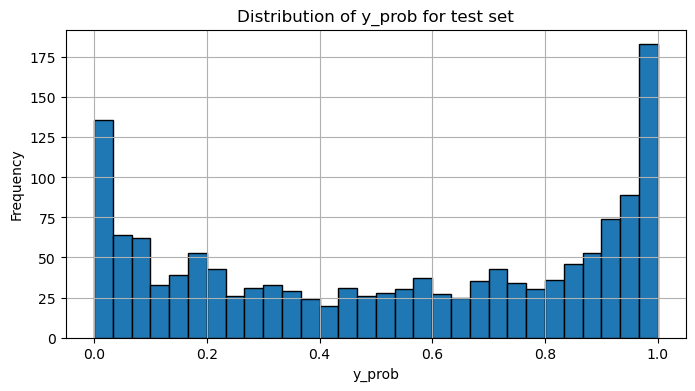

In [57]:
train_df[train_df['train']==0]['y_prob'].describe()
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))
train_df[train_df['train']==0]['y_prob'].hist(bins=30, edgecolor='black')
plt.title('Distribution of y_prob for test set')
plt.xlabel('y_prob')
plt.ylabel('Frequency')
plt.show()

In [60]:
train_df[train_df['train']==0][[metric+'_uncertainty' for metric in list_of_metrics]].describe()

,majority_vote_uncertainty,weighted_vote_uncertainty,most_probable_uncertainty
count,1420.000000,1420.000000,1420.000000
mean,0.214085,0.541595,0.881151
std,0.247494,0.399603,0.139727
min,0.000000,0.000000,0.380340
25%,0.000000,0.096987,0.822941
50%,0.200000,0.614173,0.932279
75%,0.600000,1.000000,0.991075
max,0.600000,1.000000,0.999997


In [49]:
train_df[train_df['train'] == 0]['weighted_vote' + '_uncertainty'].quantile(0.25)

np.float64(0.09698724416695953)

## select instances

In [ ]:
selected_metric= 'weighted_vote'  # Example metric, can be changed
selected = select_intances(train_df, selected_metric)

Number of unique groups for majority_vote: 8
Number of unique groups for weighted_vote: 12
Number of unique groups for most_probable: 12


# explain instances

## gradcam

In [10]:
##https://github.com/jacobgil/pytorch-grad-cam/tree/master

from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
#from pytorch_grad_cam.utils.vit import reshape_transform

### vit

In [62]:
selected_model='clip-vit-large-patch14'
huggingface=True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
selected_metric= 'weighted_vote'  # Example metric, can be changed
mode='last'
pipeline, train_df = load_pipeline_and_data(output_dir,selected_model,input_preprocessed)
train_df=compute_predictions_and_uncertainties(output_dir,selected_model,input_preprocessed)
selected = select_instances(train_df, selected_metric)

Accuracy for individual patches: 0.6795774647887324
Accuracy for majority_vote: 0.7253521126760564
Accuracy for weighted_vote: 0.7288732394366197
Accuracy for most_probable: 0.7288732394366197
Number of unique groups for majority_vote: 12
Number of unique groups for weighted_vote: 12
Number of unique groups for most_probable: 12
['weighted_vote_sure', 'weighted_vote_unsure', 'weighted_vote_ok', 'grouped_true']


,weighted_vote_sure,weighted_vote_unsure,weighted_vote_ok,grouped_true
page,,,,
184,0.0,0.0,0.0,0
696,0.0,0.0,0.0,1
2,0.0,0.0,1.0,0
315,0.0,0.0,1.0,1
43,0.0,1.0,0.0,0
713,0.0,1.0,0.0,1
3,0.0,1.0,1.0,0
58,0.0,1.0,1.0,1
1017,1.0,0.0,0.0,0


In [66]:
transform = u_transforms.get_transform(selected_model, use_patches=True, custom=False, mode='resize')
model = model_utils.get_model(name=selected_model, mode='truncated', pretrained=True, truncation='remove head')
visualizations=gradcam_on_df(selected,model,pipeline,selected_classifier,transform,huggingface,device,selected_model,mode=mode)

184 5
696 5
2 5
315 5
43 5
713 5
3 5
58 5
1017 5
74 5
378 5
602 5


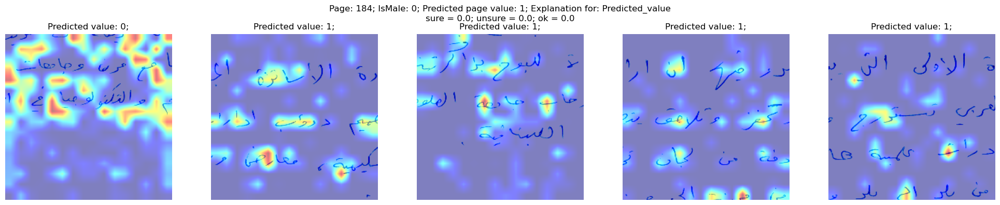

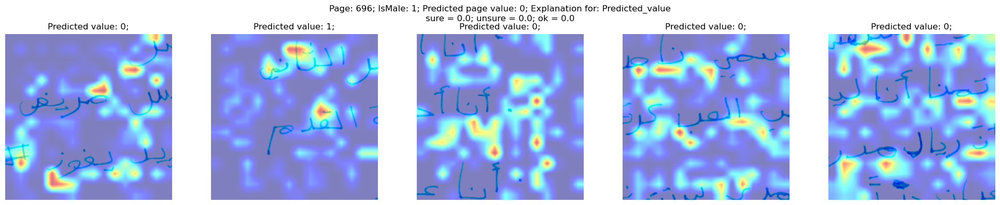

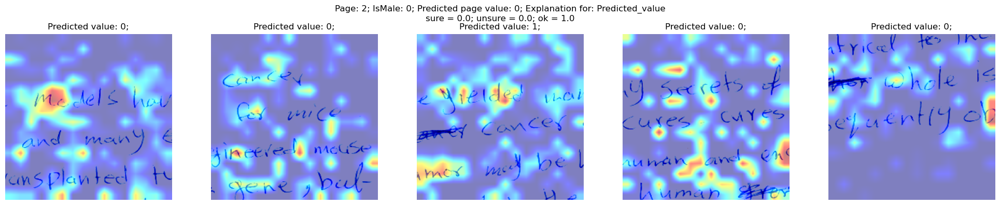

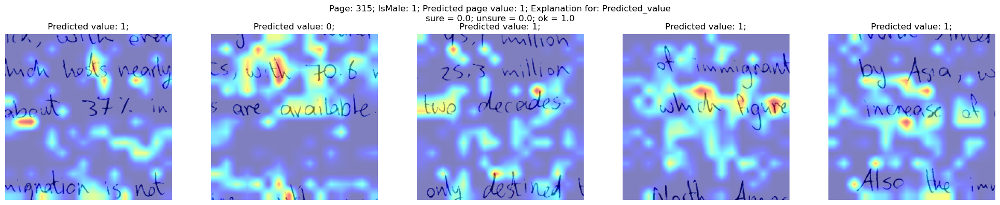

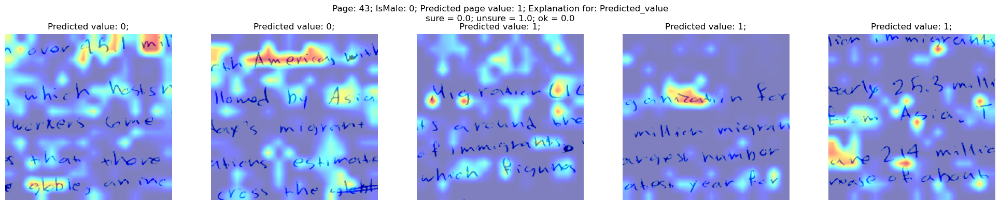

...

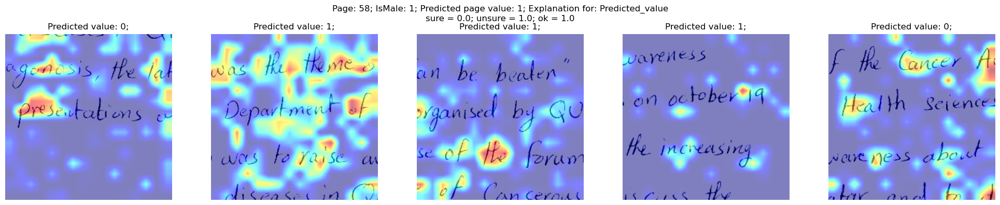

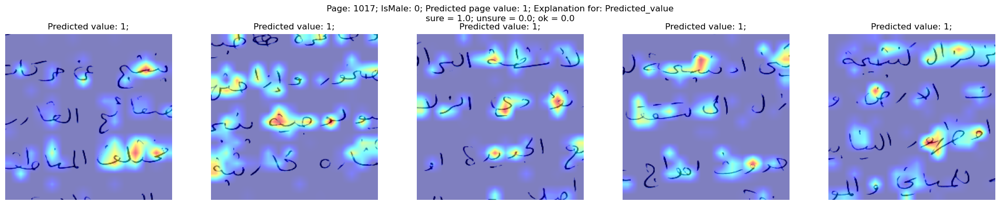

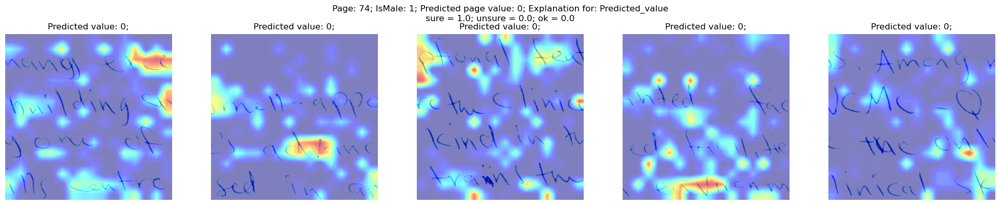

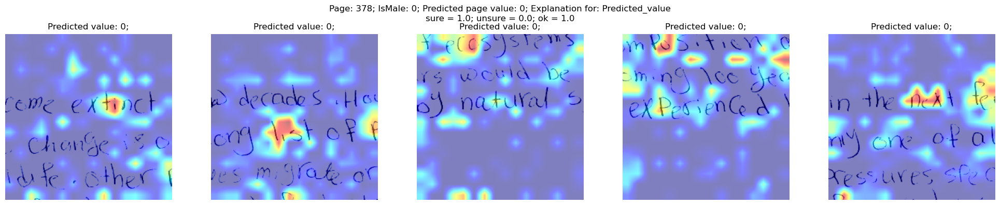

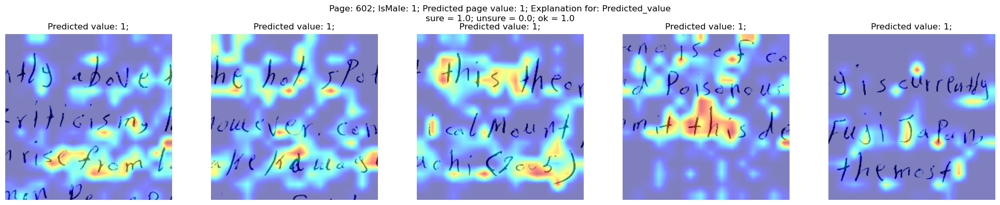

In [67]:
for i in range(len(visualizations)):
    display_gradcam_vis(visualizations, selected, i, selected_metric)
#display_gradcam_vis(visualizations,selected,7,selected_metric)

### resnet50

In [68]:
selected_model='resnet50'
huggingface=False
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
selected_metric= 'weighted_vote'  # Example metric, can be changed
mode='last'
pipeline, train_df = load_pipeline_and_data(output_dir,selected_model,input_preprocessed)
train_df=compute_predictions_and_uncertainties(output_dir,selected_model,input_preprocessed)
selected = select_instances(train_df, selected_metric)

Accuracy for individual patches: 0.5943661971830986
Accuracy for majority_vote: 0.6373239436619719
Accuracy for weighted_vote: 0.647887323943662
Accuracy for most_probable: 0.6302816901408451
Number of unique groups for majority_vote: 8
Number of unique groups for weighted_vote: 12
Number of unique groups for most_probable: 12
['weighted_vote_sure', 'weighted_vote_unsure', 'weighted_vote_ok', 'grouped_true']


,weighted_vote_sure,weighted_vote_unsure,weighted_vote_ok,grouped_true
page,,,,
1,0.0,0.0,0.0,0
987,0.0,0.0,0.0,1
1067,0.0,0.0,1.0,0
27,0.0,0.0,1.0,1
40,0.0,1.0,0.0,0
779,0.0,1.0,0.0,1
824,0.0,1.0,1.0,0
25,0.0,1.0,1.0,1
905,1.0,0.0,0.0,0


In [69]:
transform = u_transforms.get_transform(selected_model, use_patches=True, custom=False, mode='resize')
model = model_utils.get_model(name=selected_model, mode='truncated', pretrained=True, truncation='remove head')
visualizations=gradcam_on_df(selected,model,pipeline,selected_classifier,transform,huggingface,device,selected_model,mode=mode)

1 5
987 5
1067 5
27 5
40 5
779 5
824 5
25 5
905 5
153 5
250 5
363 5


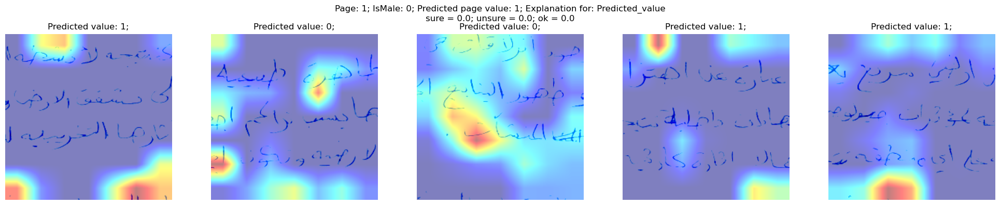

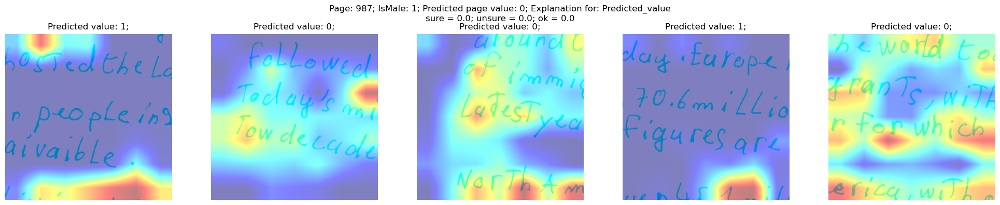

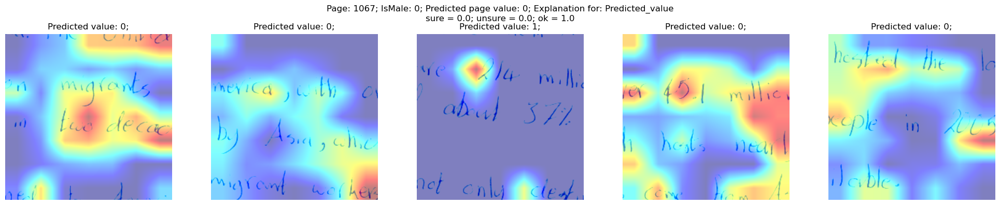

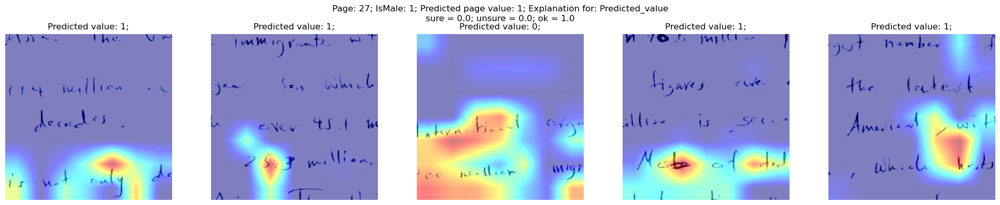

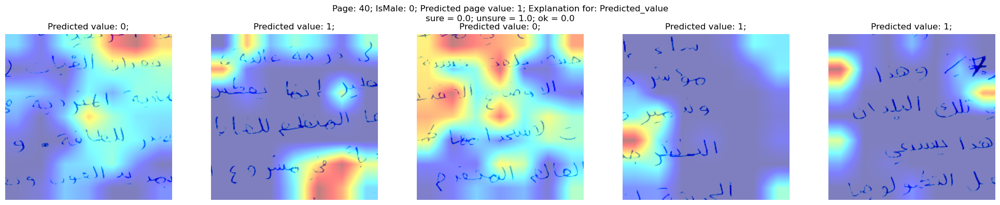

...

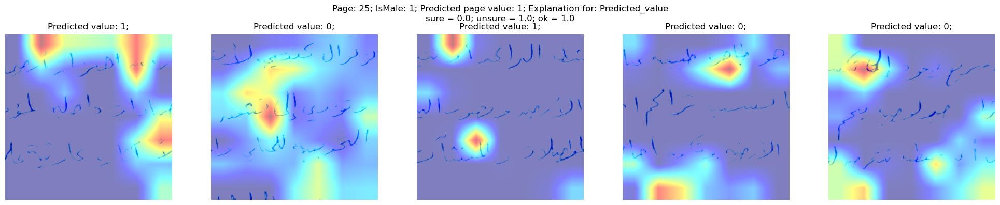

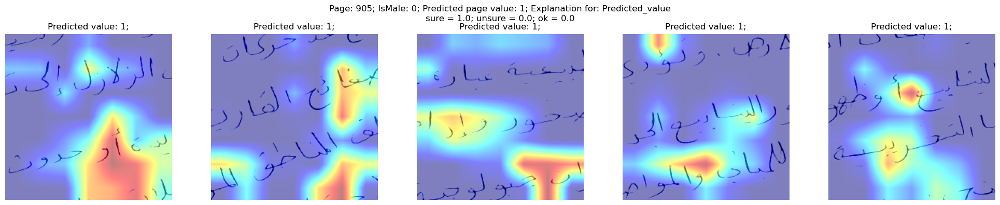

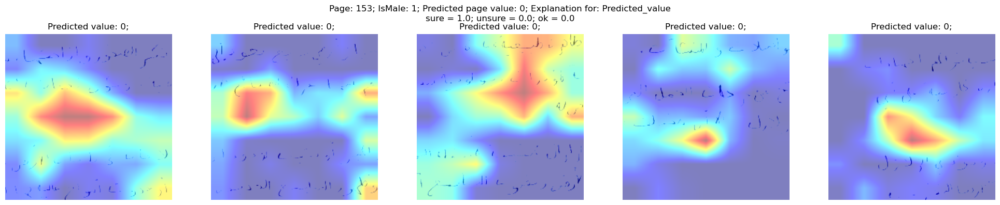

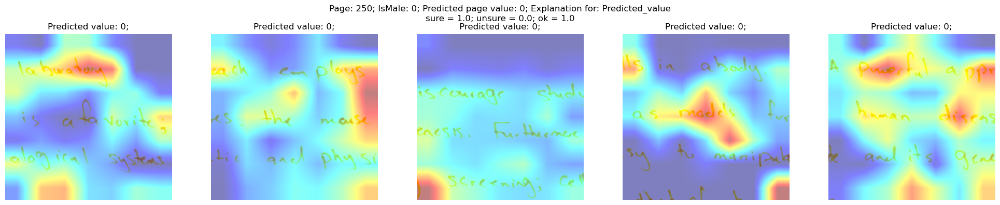

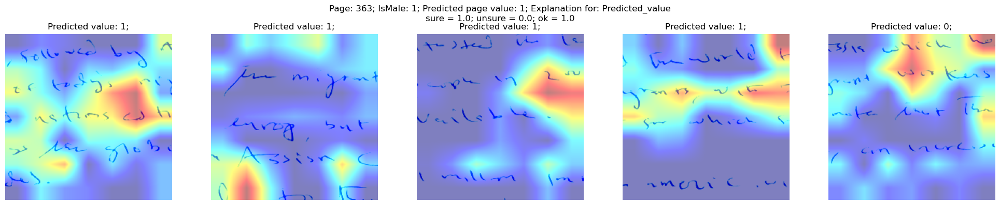

In [70]:
for i in range(len(visualizations)):
    display_gradcam_vis(visualizations, selected, i, selected_metric)

## attention based explanation

In [65]:
from utils.vit_grad_rollout import VITAttentionGradRollout

model = model_utils.get_model(name='clip-vit-large-patch14', mode='truncated', pretrained=True, truncation='remove head')
transform = u_transforms.get_transform('clip-vit-large-patch14', use_patches=True, custom=False, mode='resize')
grad_rollout = VITAttentionGradRollout(model, discard_ratio=0.9)#, head_fusion='max')
#grad_rollout = VITAttentionGradRollout(model, discard_ratio=0.9, head_fusion='max')
input_tensor = torch.rand(1, 3, 224, 224)
#mask = grad_rollout(input_tensor, category_index=0)
mask = grad_rollout(input_tensor)#, category_index=0)

TypeError: VITAttentionGradRollout.__call__() missing 1 required positional argument: 'category_index'

In [ ]:
from utils.vit_rollout import VITAttentionRollout

model = model_utils.get_model(name='clip-vit-large-patch14', mode='truncated', pretrained=True, truncation='remove head')
transform = u_transforms.get_transform('clip-vit-large-patch14', use_patches=True, custom=False, mode='resize')
rollout = VITAttentionRollout(model, discard_ratio=0.9)#, head_fusion='max')
#grad_rollout = VITAttentionGradRollout(model, discard_ratio=0.9, head_fusion='max')
input_tensor = torch.rand(1, 3, 224, 224)
#mask = grad_rollout(input_tensor, category_index=0)
mask = rollout(input_tensor)#, category_index=0)

IndexError: list index out of range

# tests

## test gradcam

In [ ]:
transform = u_transforms.get_transform(selected_model, use_patches=True, custom=False, mode='resize')
model = model_utils.get_model(name=selected_model, mode='truncated', pretrained=True, truncation='remove head')
full_model = JoinedModels(model, SKLearnLogRegWrapper(pipeline.named_steps['logreg']))
test_layers = [full_model.vision_model.model.vision_model.encoder.layers[-1].layer_norm1]#select_layer(full_model, selected_model)  # Usually the last conv layer 
# Generate a random tensor simulating a test image (batch_size=1, 3 channels, 224x224)
test_image = torch.rand(1, 3, 224, 224)
out=full_model(test_image)
print(f"Output shape: {out.shape}")
# Create a dummy target tensor for CrossEntropyLoss
# For batch_size=1 and 2 classes, target should be shape (batch_size,) with class indices
target_tensor = torch.tensor([0])  # Class index 0 for the single sample
test_image.requires_grad = True
full_model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
full_model = full_model.to(device)
test_image = test_image.to(device)
target_tensor = target_tensor.to(device)

Output shape: torch.Size([1, 2])


In [217]:
# Store the outputs in a dict for inspection
activation = {}

def hook_fn(module, input, output):
    print(f"Hooked layer: {module.__class__.__name__}")
    print(f"Output shape: {output.shape}")
    activation['output'] = output

# Register the hook on your selected target layer
handle = test_layers[0].register_forward_hook(hook_fn)
_ = full_model(test_image)
handle.remove()

Hooked layer: LayerNorm
Output shape: torch.Size([1, 257, 1024])


In [208]:
full_model.vision_model.model.vision_model.encoder.layers[-1].layer_norm1
#model.model.vision_model.encoder.layers[-1].layer_norm1

LayerNorm((1024,), eps=1e-05, elementwise_affine=True)

In [209]:
from torchinfo import summary

summary(full_model.vision_model.model.vision_model, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                                  Output Shape              Param #
CLIPVisionTransformer                                   [1, 1024]                 --
├─CLIPVisionEmbeddings: 1-1                             [1, 257, 1024]            1,024
│    └─Conv2d: 2-1                                      [1, 1024, 16, 16]         602,112
│    └─Embedding: 2-2                                   [1, 257, 1024]            263,168
├─LayerNorm: 1-2                                        [1, 257, 1024]            2,048
├─CLIPEncoder: 1-3                                      [1, 257, 1024]            --
│    └─ModuleList: 2-3                                  --                        --
│    │    └─CLIPEncoderLayer: 3-1                       [1, 257, 1024]            12,596,224
│    │    └─CLIPEncoderLayer: 3-2                       [1, 257, 1024]            12,596,224
│    │    └─CLIPEncoderLayer: 3-3                       [1, 257, 1024]            12,596,224
│    │    └─CLIPEnco

In [175]:
for name, param in full_model.named_parameters():
    print(f"{name} | Shape: {tuple(param.shape)} | Requires grad: {param.requires_grad}")

vision_model.model.logit_scale | Shape: () | Requires grad: True
vision_model.model.text_model.embeddings.token_embedding.weight | Shape: (49408, 768) | Requires grad: True
vision_model.model.text_model.embeddings.position_embedding.weight | Shape: (77, 768) | Requires grad: True
vision_model.model.text_model.encoder.layers.0.self_attn.k_proj.weight | Shape: (768, 768) | Requires grad: True
vision_model.model.text_model.encoder.layers.0.self_attn.k_proj.bias | Shape: (768,) | Requires grad: True
vision_model.model.text_model.encoder.layers.0.self_attn.v_proj.weight | Shape: (768, 768) | Requires grad: True
vision_model.model.text_model.encoder.layers.0.self_attn.v_proj.bias | Shape: (768,) | Requires grad: True
vision_model.model.text_model.encoder.layers.0.self_attn.q_proj.weight | Shape: (768, 768) | Requires grad: True
vision_model.model.text_model.encoder.layers.0.self_attn.q_proj.bias | Shape: (768,) | Requires grad: True
vision_model.model.text_model.encoder.layers.0.self_attn.ou

In [173]:
print(full_model)

JoinedModels(
  (vision_model): WrappedModel(
    (model): CLIPModel(
      (text_model): CLIPTextTransformer(
        (embeddings): CLIPTextEmbeddings(
          (token_embedding): Embedding(49408, 768)
          (position_embedding): Embedding(77, 768)
        )
        (encoder): CLIPEncoder(
          (layers): ModuleList(
            (0-11): 12 x CLIPEncoderLayer(
              (self_attn): CLIPAttention(
                (k_proj): Linear(in_features=768, out_features=768, bias=True)
                (v_proj): Linear(in_features=768, out_features=768, bias=True)
                (q_proj): Linear(in_features=768, out_features=768, bias=True)
                (out_proj): Linear(in_features=768, out_features=768, bias=True)
              )
              (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
              (mlp): CLIPMLP(
                (activation_fn): QuickGELUActivation()
                (fc1): Linear(in_features=768, out_features=3072, bias=True)
       

In [188]:
pre={}
print('input requires grad before? ',test_image.requires_grad)
for name, param in full_model.named_parameters():
    #print(name, param.requires_grad)
    pre[name] = param.requires_grad
grad_status = check_gradients(full_model, test_image, target_tensor, loss_fn = nn.CrossEntropyLoss())
print('input requires grad after? ',test_image.requires_grad)
for name in grad_status:
    if grad_status[name] != pre[name]:
        if 'text' not in name:
            print(name, grad_status[name],'but was', pre[name])

input requires grad before?  True
input requires grad after?  True
vision_model.model.logit_scale False but was True


In [190]:
test_image.shape

torch.Size([1, 3, 224, 224])

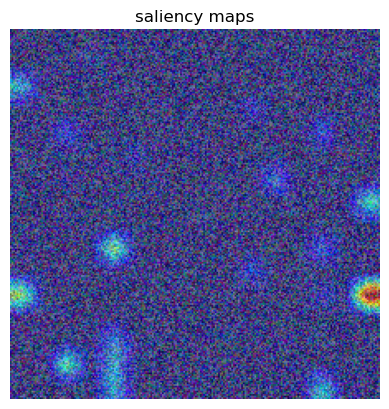

In [224]:
visualization = gradcam_on_batch(full_model, test_image, target_tensor, test_layers, reshape_transform=reshape_transform)
display_gradcam_vis(visualization)

## test classification results

In [ ]:
test_new=pd.read_csv(source_path+f'/outputs/online_deep_feature_extraction/{selected_model}_features_{input_preprocessed}')
test_old=pd.read_csv(source_path+f'/outputs/preprocessed_data/icdar_EXTRACTED_train_df_clip-vit-large-patch14_20250517_144404.csv')
# Check if the column names are the same between test_new and test_old
columns_equal = list(test_new.columns) == list(test_old.columns)
print("Column names are the same:" if columns_equal else "Column names differ.")
if not columns_equal:
    diff_new = set(test_new.columns) - set(test_old.columns)
    diff_old = set(test_old.columns) - set(test_new.columns)
    print("Columns in test_new but not in test_old:", diff_new)
    print("Columns in test_old but not in test_new:", diff_old)
cols_to_drop = [c for c in test_old.columns if (c.startswith('f') and len(c) > 1 and c[1].isdigit())]
print("test_new column types:")
print(list(test_new.drop(columns=cols_to_drop).dtypes))
print("\ntest_old column types:")
print(list(test_old.drop(columns=cols_to_drop).dtypes))
test_new[cols_to_drop].head()
test_old[cols_to_drop].head()
print("NaNs in test_old:", test_old[cols_to_drop].isna().any().any())
print("NaNs in test_new:", test_new[cols_to_drop].isna().any().any())
print("Infinite in test_old:", np.isinf(test_old[cols_to_drop].values).any())
print("Infinite in test_new:", np.isinf(test_new[cols_to_drop].values).any())
print("Dtypes in test_old[cols_to_drop]:")
print(test_old[cols_to_drop].dtypes.value_counts())
print("Dtypes in test_new[cols_to_drop]:")
print(test_new[cols_to_drop].dtypes.value_counts())
# Compute the difference between the corresponding columns in cols_to_drop
diff_df = test_new[cols_to_drop] - test_old[cols_to_drop]
diff_df.head()
print("Descriptive statistics for test_new:")
display(test_new.describe(include='all'))

print("\nDescriptive statistics for test_old:")
display(test_old.describe(include='all'))

# reload

In [13]:
def reload_modules():
    import importlib
    import utils.data_loading as data_loading
    import utils.visualization as visualization
    import utils.dataframes as dataframes
    import utils.utils_transforms as u_transforms
    import utils.training_utils as training_utils
    import utils.model_utils as model_utils
    import utils.file_IO as file_IO
    
    importlib.reload(file_IO)
    importlib.reload(data_loading)
    importlib.reload(visualization)
    importlib.reload(dataframes)
    importlib.reload(u_transforms)
    importlib.reload(model_utils)
    importlib.reload(training_utils)

    return data_loading, visualization, dataframes, u_transforms, training_utils, model_utils, file_IO
data_loading, visualization, dataframes, u_transforms, training_utils, model_utils, file_IO = reload_modules()

# functions

## loading

In [3]:
def load_pipeline_and_data(output_dir,selected_model,input_preprocessed):
    """
    Load the pipeline and model from the specified paths.
    
    Args:
        pipeline_path (str): Path to the saved pipeline.
        model_path (str): Path to the saved model.
        
    Returns:
        tuple: Loaded pipeline and model.
    """
    csv_location = f'{selected_model}_features_{input_preprocessed}'
    df_writers = pd.read_csv(output_dir+csv_location.split('.')[0]+"_writers.csv")
    train_df = pd.read_csv(output_dir+csv_location)
    train_df = train_df.drop(columns=['train'])
    train_df = train_df.merge(df_writers, on='writer', how='left')
    pipeline = load(output_dir+csv_location.split('.')[0]+"_pipeline.joblib")
    return pipeline, train_df

## saving explainability results

## instance selection

In [61]:
def compute_predictions_and_uncertainties(output_dir, selected_model, input_preprocessed):
    pipeline,train_df=load_pipeline_and_data(output_dir,selected_model,input_preprocessed)
    cols_to_drop = [c for c in train_df.columns if not(c.startswith('f') and len(c) > 1 and c[1].isdigit())]

    y_prob = pipeline.predict_proba(train_df.drop(columns=cols_to_drop).values)[:,1]
    #y_pred = pipeline.predict(X_train.values)
    y_pred =(y_prob>= 0.5).astype(int)
    train_df['y_prob'] = y_prob
    train_df['y_pred'] = y_pred
    print(f"Accuracy for individual patches: {accuracy_score(train_df[train_df['train']==0]['male'], train_df[train_df['train']==0]['y_pred'])}")
    train_df['page'] = train_df.groupby(['writer', 'isEng', 'same_text']).ngroup()
    train_df = train_df.sort_values('page').reset_index(drop=True)
    grouped_true = group_labels(train_df['male'], train_df['page'])
    train_df['grouped_true'] = train_df['page'].map(grouped_true)
    #When you use pandas.Series.groupby(), the result is sorted by group keys (i.e., the unique values in writers) unless you tell it not to.
    #train_df=train_df.merge(['grouped_true'] = grouped_true.values
    for metric in list_of_metrics:
        grouped_predictions,uncertainty = ensembled_predictions(y_pred, train_df['page'], mode=metric,probs=y_prob)
        train_df[metric]= train_df['page'].map(grouped_predictions)
        train_df[metric+'_uncertainty'] = train_df['page'].map(uncertainty)
        print(f"Accuracy for {metric}: {accuracy_score(train_df[train_df['train']==0]['grouped_true'], train_df[train_df['train']==0][metric])}")
    # Save the predictions to a CSV file
    #cross_val_subgroup_accuracies.append(compute_subgroup_accuracies(pipeline, train_FE_temp, cols_to_drop, target_label))
    n_patches = int(len(train_df)/len(train_df['page'].unique()))
    train_df['majority_vote_uncertainty'] /= n_patches #-> 1 if all patches classified the same, 0 if all patches classified differently
    return train_df
def select_instances(train_df,metric):
    grouped = train_df[train_df['train'] == 0].groupby('page').first()[['grouped_true'] + list_of_metrics +[metric + '_uncertainty' for metric in list_of_metrics]].reset_index()
    for metric in list_of_metrics:

        percentile_25 = grouped[metric + '_uncertainty'].quantile(0.25) #threshold for unsure
        percentile_75 = grouped[metric + '_uncertainty'].quantile(0.75) #threshold for sure
        grouped[metric+'_selected'] = 0
        grouped[metric+'_sure'] = (grouped[metric+'_uncertainty'] >= percentile_75).astype(int)
        grouped[metric+'_unsure'] = (grouped[metric+'_uncertainty'] <= percentile_25).astype(int)
        grouped[metric+'_ok'] = (grouped[metric] == grouped['grouped_true']).astype(int)
        # Group by sure, unsure, ok, and grouped_true, assign a unique number to each group
        class_grouped=grouped.groupby([metric + '_sure', metric + '_unsure', metric + '_ok', 'grouped_true'])
        for group_id, group_df in class_grouped:
            idx = group_df.sample(1, random_state=42).index if not group_df.empty else group_df.sample(1, random_state=42).index
            grouped.loc[idx, metric + '_selected'] = 1
        print(f"Number of unique groups for {metric}: {(class_grouped.ngroup()).nunique()}")

        '''#select one sure and ok and 0
        conditions = (grouped[metric+'_uncertainty'] >= percentile_75) & (train_df[metric] == train_df['grouped_true']) & (1 == train_df['grouped_true'])
        selected = grouped[conditions].sample(1)
        grouped.loc[selected.index, metric+'_selected'] = 1'''
    cols_to_drop = ['grouped_true'] + [metric + '_uncertainty' for metric in list_of_metrics]+list_of_metrics
    grouped = grouped.drop(columns=cols_to_drop)
    train_df = train_df.merge(grouped, on='page', how='left')

    selected = train_df[train_df[selected_metric + '_selected'] == 1]
    grouping = ['sure', 'unsure', 'ok']
    grouping = [selected_metric + '_' + group for group in grouping] + ['grouped_true']
    print(grouping)
    display(selected[grouping+['page']].groupby('page').first().sort_values(grouping))
    return selected.sort_values(grouping)

## explainability functions

In [65]:
#cam explanations
class JoinedModels(nn.Module):
    def __init__(self, vision_model, classifier):
        super().__init__()
        self.vision_model = vision_model
        self.classifier = classifier

    def forward(self, x):
        features = self.vision_model(x)  # image -> features
        logits = self.classifier(features)  # features -> prediction
        return logits
class SKLearnLogRegWrapper(nn.Module):
    def __init__(self, sklearn_model):
        super().__init__()
        coef = torch.tensor(sklearn_model.coef_, dtype=torch.float32)
        intercept = torch.tensor(sklearn_model.intercept_, dtype=torch.float32)
        self.linear = nn.Linear(coef.shape[1], coef.shape[0])
        with torch.no_grad():
            self.linear.weight.copy_(coef)
            self.linear.bias.copy_(intercept)

    def forward(self, x):
        logits = self.linear(x)
        p1 = torch.sigmoid(logits)
        p0 = 1 - p1
        return torch.cat([p0, p1], dim=1)  # Shape: [B, 2]
def load_images(df,transform,huggingface):
    """
    Loads an image from the specified path and converts it to a tensor.
    """
    for idx, row in df.iterrows():
        image = Image.open(row['file_name']).convert('RGB')
        x1 = row['x']
        y1 = row['y']
        x2 = row['x2']
        y2 = row['y2']
        patch = image.crop((x1, y1, x2, y2))
        if huggingface:
            # the transform is actually an huggingface processor in this case
            inputs = transform(images=patch, return_tensors="pt")
            # Remove batch dimension from inputs
            patch = inputs['pixel_values'].squeeze()
        else:
            patch = transform(patch)
        transformed_image=patch.unsqueeze(0)
        if 'transformed_images' not in locals():
            transformed_images = transformed_image
        else:
            transformed_images = torch.cat((transformed_images, transformed_image), dim=0)
    return transformed_images
def select_layer(model,model_name,mode='last'):
    """
    Selects a specific layer from the model by its name.
    """
    if model_name == 'clip-vit-large-patch14':
        # For CLIP, you might want to select the last layer of the transformer
        return [model.vision_model.model.vision_model.encoder.layers[-1].layer_norm1]
    elif model_name == 'resnet50':
        # For ResNet, you might want to select the last convolutional layer
        if mode == 'last':
            return [model.vision_model.layer4[-1]]
        elif mode == 'first':
            return [model.vision_model.layer1[-1]]
    return   
def get_reshape_transform(model_name):
    """
    Returns a reshape transform function based on the model name.
    """
    if model_name == 'clip-vit-large-patch14':
        return reshape_transform  # Use the custom reshape_transform defined above
    elif model_name == 'resnet50':
        return None
    else:
        raise ValueError(f"Unsupported model name: {model_name}")
def gradcam_on_df(df,model,pipeline,selected_model,transform,huggingface,device,model_name='clip-vit-large-patch14', mode='last'):
    if selected_model == 'logreg':
        # If the model is a logistic regression, wrap it in a PyTorch module
        classifier = SKLearnLogRegWrapper(pipeline.named_steps['logreg'])
    else:
        raise ValueError(f"Unsupported model type: {selected_model}. Only 'logreg' is supported for now.")
    model= JoinedModels(model,classifier)
    model = model.to(device)
    # Get a batch of data from train_dataloader
    grouped = df.groupby('page', sort=False)
    #print(model)
    target_layers = select_layer(model,model_name,mode) # Usually the last conv layer
    model.eval()
    page_groups_visualizations = []
    #print(target_layers)
    for page, group in grouped:
        n_patches=len(group['grouped_true'].values)
        print(page,n_patches)
        labels = torch.tensor(group['y_pred'].values)  # Extract labels and convert to tensor
        #labels = torch.ones(n_patches, dtype=torch.long, device=device)
        #labels = torch.zeros(n_patches, dtype=torch.long, device=device)
        #predictions = torch.tensor(group['y_pred'].values)   # Extract predictions and convert to tensor
        # The batch correct shape is (batch_size, 3, H, W)

        reshape_transform = get_reshape_transform(model_name) 
        
        input_tensor = load_images(group, transform=transform, huggingface=huggingface)
        input_tensor.requires_grad = True
        input_tensor = input_tensor.to(device)
        
        visualizations = gradcam_on_batch(model, input_tensor, labels, target_layers, reshape_transform=reshape_transform)
        page_groups_visualizations.append(visualizations)
    return page_groups_visualizations
def gradcam_on_batch(model, input_tensor, labels, target_layers, reshape_transform=None):
    # Specify the target layers and targets
    targets = [ClassifierOutputTarget(label.item()) for label in labels]  # Create targets for each image in the batch

    # Construct the CAM object and apply it to the batch
    if reshape_transform:
        cam = GradCAM(model=model, target_layers=target_layers, reshape_transform=reshape_transform)
    else:
        cam = GradCAM(model=model, target_layers=target_layers)
    with cam:
        # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
        grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
        
        # Visualize each image in the batch
        visualizations = []
        for i in range(len(labels)):
            rgb_image = torch.clamp(input_tensor[i].permute(1, 2, 0), 0, 1).cpu().detach().numpy().astype(np.float32)
            grayscale_cam = grayscale_cams[i]
            visualization = show_cam_on_image(rgb_image, grayscale_cam, use_rgb=True)
            visualizations.append(visualization)
    return visualizations
def reshape_transform(tensor, height=16, width=16):
    result = tensor[:, 1 :  , :].reshape(tensor.size(0),
        height, width, tensor.size(2))

    # Bring the channels to the first dimension,
    # like in CNNs.
    result = result.transpose(2, 3).transpose(1, 2)
    return result
def check_gradients(model, input_tensor, target_tensor, loss_fn):
    """
    Checks if gradients are flowing through the model.
    Args:
        model: The PyTorch model.
        input_tensor: Input tensor with requires_grad=True.
        target_tensor: Target tensor for loss computation.
        loss_fn: Loss function (e.g., nn.CrossEntropyLoss()).
    Returns:
        grad_status: Dict mapping parameter names to whether gradients are non-zero.
    """
    model.zero_grad()
    output = model(input_tensor)
    loss = loss_fn(output, target_tensor)
    loss.backward()
    grad_status = {}
    for name, param in model.named_parameters():
        if param.grad is not None:
            grad_status[name] = param.grad.abs().sum().item() > 0
        else:
            grad_status[name] = False
    return grad_status

## visualization functions

In [47]:
#gradcam visualization
# Display the visualizations
def display_gradcam_vis(visualizations,df,ind,selected_metric='weighted_vote'):
    pages = df['page'].unique()
    page = pages[ind]
    group = df[df['page'] == page]
    types = ['sure', 'unsure', 'ok']
    grouping = [selected_metric + '_' + g for g in types] 
    n = len(visualizations[ind])
    plt.figure(figsize=(4 * n, 4))
    for i, visualization in enumerate(visualizations[ind]):
        plt.subplot(1, n, i + 1)
        plt.imshow(visualization)
        #print(group[selected_metric].iloc[0])
        plt.suptitle(f"Page: {page}; IsMale: {group['male'].iloc[i]}; Predicted page value: {group[selected_metric].iloc[i]}; Explanation for: Predicted_value\n"
                  f"{types[0]} = {group[grouping[0]].iloc[i]}; {types[1]} = {group[grouping[1]].iloc[i]}; {types[2]} = {group[grouping[2]].iloc[i]}")
        plt.title(f"Predicted value: {group['y_pred'].iloc[i]};")
        #plt.xlabel(f"{types[0]} = {group[grouping[0]].iloc[i]}; {types[1]} = {group[grouping[1]].iloc[i]}; {types[2]} = {group[grouping[2]].iloc[i]}", fontsize=16, y=1.05)
        
        plt.axis('off')
    plt.tight_layout()
    plt.show()

## prediction functions

In [7]:
def ensembled_predictions(base_preds,writers,mode='majority_vote',probs=None):
    pred_df = pd.DataFrame({
            'writer': writers,
            'pred': base_preds
        })
    if probs is not None:
        probs = np.abs(probs - 0.5) / 0.5
        pred_df['prob'] = probs
    if mode == 'majority_vote':
        def most_common_with_diff(x):
            counts = Counter(x)
            most_common_count = counts.most_common(1)[0][1]
            least_common_count = counts.most_common()[-1][1]
            return pd.Series({
            'writer_pred': counts.most_common(1)[0][0],
            'count_diff': most_common_count - least_common_count
            })
        def most_common_with_diff_with_fallback(group):
            preds = group['pred']
            counts = Counter(preds)

            # Check for tie
            common = counts.most_common()
            if len(common) > 1 and common[0][1] == common[1][1]:
                # Tie fallback: choose label with highest summed probability
                total_prob = group.groupby(group['pred'])['prob'].sum()
                fallback_label = total_prob.idxmax()
                most_common_label = fallback_label
                count_diff = 0
            else:
                most_common_label = common[0][0]
                count_diff = common[0][1] - common[-1][1]

            return pd.Series({
                'writer_pred': most_common_label,
                'count_diff': count_diff
            })
        writer_stats = pred_df.groupby('writer').apply(lambda df: most_common_with_diff(df['pred'])).reset_index()
        #writer_stats = pred_df.groupby('writer').apply(most_common_with_diff_with_fallback).reset_index()
        writer_preds = writer_stats['writer_pred']
        uncertainty = writer_stats['count_diff']
    elif mode == 'weighted_vote':
        if probs is None:
            raise ValueError("For 'weighted_vote', 'probs' must be provided.")
        writer_preds = pred_df.groupby('writer', group_keys=False).apply(
            lambda x: pd.Series({
                'writer_pred': round((x['pred'] * x['prob']).sum() / x['prob'].sum())
            })
        )['writer_pred'].astype(int)
        uncertainty = pred_df.groupby('writer', group_keys=False).apply(
            lambda x: pd.Series({
                'writer_pred': np.abs((x['pred'] * x['prob']).sum() / x['prob'].sum() - 0.5) / 0.5
            })
        )['writer_pred']
    elif mode == 'most_probable':
        if probs is None:
            raise ValueError("For 'most_probable', 'probs' must be provided.")
        writer_preds = pred_df.groupby('writer', group_keys=False).apply(
            lambda x: x.loc[x['prob'].idxmax(), 'pred']
        )
        uncertainty = pred_df.groupby('writer', group_keys=False).apply(
            lambda x: x.loc[x['prob'].idxmax(), 'prob']
        )
        

    # Step 5: Map writer-level prediction back to each sample
    #final_preds = writers.map(writer_preds)
    return writer_preds,uncertainty

def group_labels(y, writers):
    """
    Groups labels by writer.
    """
    grouped_labels = y.groupby(writers).agg(lambda x: Counter(x).most_common(1)[0][0])
    return grouped_labels

def compute_accuracies(y_true, y_pred, y_prob, pages, writers):
    """
    Computes accuracy for each writer.
    """
    accuracies = {}
    accuracies['individual'] = accuracy_score(y_true, y_pred)

    grouped_true = group_labels(y_true, pages)
    grouped_pred = ensembled_predictions(y_pred, pages)
    accuracies['ensembled'] = accuracy_score(grouped_true, grouped_pred)

    grouped_pred = ensembled_predictions(y_pred, pages, mode='weighted_vote',probs=y_prob)
    accuracies['ensembled_weighted'] = accuracy_score(grouped_true, grouped_pred)

    grouped_pred = ensembled_predictions(y_pred, pages, mode='most_probable',probs=y_prob)
    accuracies['ensembled_most_probable'] = accuracy_score(grouped_true, grouped_pred)

    grouped_true_writers = group_labels(y_true, writers)
    grouped_pred_writers = ensembled_predictions(y_pred, writers)
    accuracies['ensembled_writers'] = accuracy_score(grouped_true_writers, grouped_pred_writers)
    
    return accuracies


def select_groups(train_FE,select_column='train', train_on_language='arabic', train_on_same='same'):
        train_FE[select_column] = 1
        if train_on_language=='arabic':
            train_FE.loc[train_FE['isEng'] == 1, select_column] = 0 #remove english
        elif train_on_language=='english':
            train_FE.loc[train_FE['isEng'] == 0, select_column] = 0 #remove arabic
        else:
            pass
        if train_on_same=='same':
            train_FE.loc[train_FE['same_text'] == 0, select_column] = 0 #remove different texts
        elif train_on_same=='different':
            train_FE.loc[train_FE['same_text'] == 1, select_column] = 0 #remove same texts
        else:
            pass
        return train_FE


def compute_subgroup_accuracies(pipeline, train_df,cols_to_drop,target_label):
    subgroup_accuracies = {}
    groups = [('english','different'), ('english','same'), ('arabic','different'), ('arabic','same'),
              ('english','all'), ('arabic','all'), ('all','different'), ('all','same')]
    group_sizes = []
    acc_keys=None
    for group in groups:
        train_df=select_groups(train_df,select_column='train', 
                            train_on_language=group[0], train_on_same=group[1])
        X_s = train_df[train_df['train']==1].drop(columns=cols_to_drop)
        y_s = train_df[train_df['train']==1][target_label]
        writers_s = train_df[train_df['train']==1]['writer']
        pages_s = train_df[train_df['train']==1]['page']
        group_sizes.append(len(X_s))

        y_prob= pipeline.predict_proba(X_s.values)[:,1]
        #y_pred = pipeline.predict(X_s.values)
        y_pred=(y_prob >= 0.5).astype(int)
        accuracies = compute_accuracies(y_s, y_pred, y_prob, pages_s,writers_s)
        subgroup_accuracies[f'{group[0]},{group[1]}'] = accuracies

    return subgroup_accuracies

## script launching

In [8]:
def run_experiment(try_args,script_name):
    with tempfile.NamedTemporaryFile(mode='w', delete=False, suffix='.yaml') as tmp:
        yaml.dump(try_args.__dict__, tmp)
        tmp_path = tmp.name
    process = subprocess.Popen(
        ['python', script_name, '--config', tmp_path],
        stdout=subprocess.PIPE,
        stderr=subprocess.PIPE,
        text=True
    )
    # Print stdout in real time
    while True:
        output = process.stdout.readline()
        if output == '' and process.poll() is not None:
            break
        if output:
            print(output, end='')
    # Print any remaining stderr
    stderr = process.stderr.read()
    if stderr:
        print(stderr, end='')
    result = process.wait()
    #print(result.stdout)
    #print(result.stderr)
    print(f"Experiment finished with return code: {result}")
    if result != 0:
        print(f"Error output:\n{result}")
    return 

def run_experiment_threaded(try_args, script_name):
    def stream_output(pipe, name):
        for line in iter(pipe.readline, ''):
            if line:
                print(f"[{name}] {line}", end='')

    with tempfile.NamedTemporaryFile(mode='w', delete=False, suffix='.yaml') as tmp:
        yaml.dump(try_args.__dict__, tmp)
        tmp_path = tmp.name

    print(f"Starting experiment: file={try_args.input_file_name}, model={try_args.selected_model}, PCA={try_args.with_pca}")

    process = subprocess.Popen(
        ['python', script_name, '--config', tmp_path],
        stdout=subprocess.PIPE,
        stderr=subprocess.PIPE,
        text=True
    )

    # Start threads for live output
    stdout_thread = threading.Thread(target=stream_output, args=(process.stdout, 'STDOUT'))
    stderr_thread = threading.Thread(target=stream_output, args=(process.stderr, 'STDERR'))
    stdout_thread.start()
    stderr_thread.start()

    process.wait()
    stdout_thread.join()
    stderr_thread.join()

    print(f"Experiment finished with return code: {process.returncode}")
    return

In [9]:
class DotDict:
    def __init__(self, **entries):
        self.__dict__.update(entries)

    def __setitem__(self, key, value):
        setattr(self, key, value)

    def __getitem__(self, key):
        return getattr(self, key)

    def __repr__(self):
        return f"{self.__dict__}"
def load_config(path):
    with open(path, 'r') as f:
        config = yaml.safe_load(f)
        return DotDict(**config)